In [18]:
from gammaALPs.core import Source, ALP, ModuleList
from gammaALPs.base import environs, transfer
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patheffects import withStroke
from ebltable.tau_from_model import OptDepth
from astropy import constants as c
%matplotlib inline
from scipy import interpolate
import scipy.interpolate as spi
import pandas as pd

In [19]:
m_array = np.logspace(-1,1,10)
g_array = np.logspace(np.log10(0.5),np.log10(5),10)
EGeV = np.logspace(-1,3.5,250)

In [20]:
def P(mass=1,g=0.5,B0=1e4,n0=1e5,nsim=10,r_core=1e-4,q=-2.80,gamma_min=1,Rjet=10,beta=-2,gamma_max=np.exp(10.),EGeV = np.logspace(-1,3.5,250)):
    src = Source(z = 0.002 , ra = '02h42m41s', dec = '+00d00m48s')
    EGeV = EGeV
    alp = ALP(mass,g)
    pin = np.diag((1.,1.,0.)) * 0.5
    
    m = ModuleList(alp, src, pin = pin, EGeV = EGeV)

    m.add_propagation("ICMGaussTurb", 
                      0, # position of module counted from the source. 
                      nsim = nsim, # number of random B-field realizations
                      B0 = B0,  # rms of B field
                      n0 = n0,  # normalization of electron density
    #                   n2 = 4.05, # second normalization of electron density, see Churazov et al. 2003, Eq. 4
                      r_abell = 500., # extension of the cluster
                      r_core = r_core,   # electron density parameter, see Churazov et al. 2003, Eq. 4
    #                   r_core2 = 280., # electron density parameter, see Churazov et al. 2003, Eq. 4
                      beta = 1.2,  # electron density parameter, see Churazov et al. 2003, Eq. 4
    #                   beta2= 0.58, # electron density parameter, see Churazov et al. 2003, Eq. 4
                      eta = 0.5, # scaling of B-field with electron denstiy
                      kL = 0.18, # maximum turbulence scale in kpc^-1, taken from A2199 cool-core cluster, see Vacca et al. 2012 
                      kH = 9.,  # minimum turbulence scale, taken from A2199 cool-core cluster, see Vacca et al. 2012
                      q = q, # turbulence spectral index, taken from A2199 cool-core cluster, see Vacca et al. 2012
                      seed=0 # random seed for reproducability, set to None for random seed.
                     )
    m.add_propagation("EBL",1, model = 'dominguez') # EBL attenuation comes second, after beam has left cluster
    m.add_propagation("GMF",2, model = 'jansson12', model_sum = 'ASS') # finally, the beam enters the Milky Way Field

    m.add_propagation("Jet",
                      0,  # position of module counted from the source.
                      B0=B0,  # Jet field at r = R0 in G
                      r0=r_core,  # distance from BH where B = B0 in pc
                      rgam=r_core, #1e15 * u.cm.to('pc'),  # distance of gamma-ray emitting region to BH
                      alpha=-1.,  # exponent of toroidal mangetic field (default: -1.)
                      psi=np.pi/4.,  # Angle between one photon polarization state and B field.
                                     # Assumed constant over entire jet.
                      helical=True,  # if True, use helical magnetic-field model from Clausen-Brown et al. (2011).
                                     # In this case, the psi kwarg is treated is as the phi angle
                                     # of the photon trajectory in the cylindrical jet coordinate system
                      equipartition=True,  # if true, assume equipartition between electrons and the B field.
                                           # This will overwrite the exponent of electron density beta = 2 * alpha
                                           # and set n0 given the minimum electron lorentz factor set with gamma_min
                      gamma_min=gamma_min,  # minimum lorentz factor of emitting electrons, only used if equipartition=True
                      gamma_max=gamma_max * gamma_min,  # maximum lorentz factor of emitting electrons,
                                                          # only used if equipartition=True
                      Rjet= Rjet,  # maximum jet length in pc (default: 1000.)
                      n0=n0,  # normalization of electron density, overwritten if equipartition=True
                      beta=-2.    # power-law index of electron density, overwritten if equipartition=True
                     )
    px,py,pa = m.run(multiprocess=2)
    pgg = px + py # the total photon survival probability
    return m.EGeV,pgg

# Modified function to calculate the product for each energy in the EGeV range used by the photon-axion conversion probability calculation

def calculate_flux_product_with_energy(file='NGC1068cascadepg_1e4Rs.csv', mass=1, g=0.5, B0=1e4, n0=1e5, nsim=10, r_core=1e-4, q=-2.80, gamma_min=1, Rjet=10, beta=-2, gamma_max=np.exp(10),rgam=1e-1,EGeV = np.logspace(-1, 3.5, 250)):
    src = Source(z=0.002, ra='02h42m41s', dec='+00d00m48s')
    EGeV = EGeV
    alp = ALP(mass, g)
    pin = np.diag((1.,1.,0.)) * 0.5    
    
    file_path = file
    flux_data = pd.read_csv(file_path)
    # Extracting the columns for interpolation
    x_values = flux_data['x']  # Photon energy
    y_values = flux_data['Curve1']  # Flux of photons
    # Creating the interpolation function
    interpolated_flux = spi.interp1d(x_values, y_values, kind='cubic', fill_value="extrapolate")
    
    
    m = ModuleList(alp, src, pin = pin, EGeV = EGeV)
    m.add_propagation("ICMGaussTurb", 
                      0, # position of module counted from the source. 
                      nsim = nsim, # number of random B-field realizations
                      B0 = B0,  # rms of B field
                      n0 = n0,  # normalization of electron density
    #                   n2 = 4.05, # second normalization of electron density, see Churazov et al. 2003, Eq. 4
                      r_abell = 500., # extension of the cluster
                      r_core = r_core,   # electron density parameter, see Churazov et al. 2003, Eq. 4
    #                   r_core2 = 280., # electron density parameter, see Churazov et al. 2003, Eq. 4
                      beta = 1.2,  # electron density parameter, see Churazov et al. 2003, Eq. 4
    #                   beta2= 0.58, # electron density parameter, see Churazov et al. 2003, Eq. 4
                      eta = 0.5, # scaling of B-field with electron denstiy
                      kL = 0.18, # maximum turbulence scale in kpc^-1, taken from A2199 cool-core cluster, see Vacca et al. 2012 
                      kH = 9.,  # minimum turbulence scale, taken from A2199 cool-core cluster, see Vacca et al. 2012
                      q = q, # turbulence spectral index, taken from A2199 cool-core cluster, see Vacca et al. 2012
                      seed=0 # random seed for reproducability, set to None for random seed.
                     )
    m.add_propagation("EBL",1, model = 'dominguez') # EBL attenuation comes second, after beam has left cluster
    m.add_propagation("GMF",2, model = 'jansson12', model_sum = 'ASS') # finally, the beam enters the Milky Way Field

    m.add_propagation("Jet",
                      0,  # position of module counted from the source.
                      B0=B0,  # Jet field at r = R0 in G
                      r0=r_core,  # distance from BH where B = B0 in pc
                      rgam=rgam, #1e15 * u.cm.to('pc'),  # distance of gamma-ray emitting region to BH
                      alpha=-1.,  # exponent of toroidal mangetic field (default: -1.)
                      psi=np.pi/4.,  # Angle between one photon polarization state and B field.
                                     # Assumed constant over entire jet.
                      helical=True,  # if True, use helical magnetic-field model from Clausen-Brown et al. (2011).
                                     # In this case, the psi kwarg is treated is as the phi angle
                                     # of the photon trajectory in the cylindrical jet coordinate system
                      equipartition=True,  # if true, assume equipartition between electrons and the B field.
                                           # This will overwrite the exponent of electron density beta = 2 * alpha
                                           # and set n0 given the minimum electron lorentz factor set with gamma_min
                      gamma_min=gamma_min,  # minimum lorentz factor of emitting electrons, only used if equipartition=True
                      gamma_max=gamma_max * gamma_min,  # maximum lorentz factor of emitting electrons,
                                                          # only used if equipartition=True
                      Rjet= Rjet,  # maximum jet length in pc (default: 1000.)
                      n0=n0,  # normalization of electron density, overwritten if equipartition=True
                      beta=-2.    # power-law index of electron density, overwritten if equipartition=True
                     )
    px,py,pa = m.run(multiprocess=2)
    pgg = px + py # the total photon survival probability    
    
    products = np.multiply(pgg,interpolated_flux(EGeV))
   
    return EGeV,pgg,products

In [21]:
Flux_ = calculate_flux_product_with_energy(file='NGC1068cascadepg_300Rs.csv',mass=0.1, g=1e-10,nsim=10,B0=0.4,rgam=1e-3,n0=1e7,Rjet=1e3,EGeV= np.logspace(-1,3.5,250))[2]
Flux_2 = calculate_flux_product_with_energy(file='NGC1068cascadepg_300Rs.csv',mass=0.1, g=1,nsim=10,B0=0.4,rgam=1e-3,n0=1e7,Rjet=1e3,EGeV= np.logspace(-1,3.5,250))[2]
Flux_3 = calculate_flux_product_with_energy(file='NGC1068cascadepg_300Rs.csv',mass=0.1, g=1,nsim=10,B0=100,rgam=1e-3,n0=1e7,Rjet=1e3,EGeV= np.logspace(-1,3.5,250))[2]

environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 2.052e+02 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 2.052e+02 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inp

In [22]:
print(np.size(Flux_))

2500


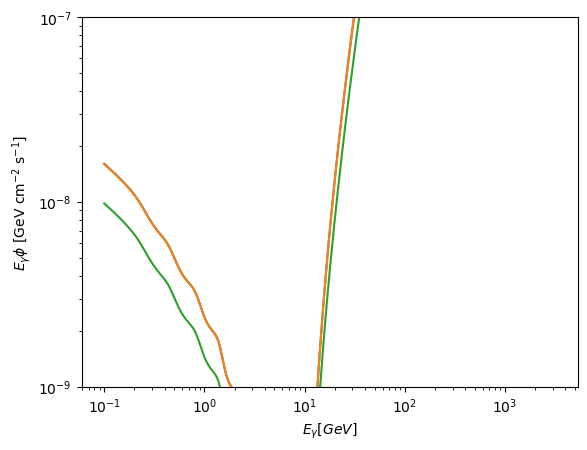

In [23]:
#flux_1=calculate_flux_product_with_energy(file='NGC1068cascadepg_1e4Rs.csv', mass=1, g=0.5, B0=1e4, n0=1e5, nsim=10, r_core=1e-4, q=-2.80, gamma_min=1, Rjet=10, beta=-2, gamma_max=np.exp(10),rgam=1e-1,EGeV = np.logspace(-1, 3.5, 250))[0][2]
#flux_2=calculate_flux_product_with_energy(file='NGC1068cascadepg_1e4Rs.csv', mass=1, g=0.5, B0=1e6, n0=1e5, nsim=10, r_core=1e-4, q=-2.80, gamma_min=1, Rjet=10, beta=-2, gamma_max=np.exp(10),rgam=1e-1,EGeV = np.logspace(-1, 3.5, 250))[0][2]
#flux_2=calculate_flux_product_with_energy(file='NGC1068cascadepg_1e4Rs.csv', mass=10, g=0.5, B0=1e4, n0=1e5, nsim=10, r_core=1e-4, q=-2.80, gamma_min=1, Rjet=10, beta=-2, gamma_max=np.exp(10),rgam=1e-1,EGeV = np.logspace(-1, 3.5, 250))[0][2]
#########

plt.xlabel(r'$E_{\gamma}[GeV]$')
plt.ylabel(r'$E_{\gamma}\phi$ [GeV cm$^{-2}$ s$^{-1}$]')
plt.loglog(np.logspace(-1, 3.5, 250), Flux_[0,:])
plt.loglog(np.logspace(-1, 3.5, 250), Flux_2[0,:])
plt.loglog(np.logspace(-1, 3.5, 250), Flux_3[0,:])
axes = plt.gca()
axes.set_ylim([1e-9,1e-7])
plt.show()

In [24]:
# Fermi data
import pandas as pd

data_central = pd.read_csv('NGC1068_FLat_central_values.csv', header=0, index_col=False, engine='python', na_values='-',delim_whitespace=False)
#E_GeV_central = data_central['Energy_GeV']
#Flux_central = data_central['emission']
data_central.columns = ["energy", "rate"]
#efficiency_txt = np.loadtxt('/home/gonzalo/Documents/PHYSICS/PHD/neutrino_EM_scattering_project/zenodo/efficiency.txt',usecols=(0, 3))
E_GeV_central = list(data_central.energy)
Flux_central = list(data_central.rate)

data_low = pd.read_csv('NGC1068_FLat_lower_errors.csv', header=0, index_col=False, engine='python', na_values='-',delim_whitespace=False)
#E_GeV_low = data_low['Energy_GeV']
#Flux_low = data_low['emission']
data_low.columns = ["energy", "rate"]
#efficiency_txt = np.loadtxt('/home/gonzalo/Documents/PHYSICS/PHD/neutrino_EM_scattering_project/zenodo/efficiency.txt',usecols=(0, 3))
E_GeV_low = list(data_low.energy)
Flux_low = list(data_low.rate)


data_up = pd.read_csv('NGC1068_FLat_upper_errors.csv', header=0, index_col=False, engine='python', na_values='-',delim_whitespace=False)
#E_GeV_up = data_up['Energy_GeV']
#Flux_up = data_up['emission']
data_up.columns = ["energy", "rate"]
#efficiency_txt = np.loadtxt('/home/gonzalo/Documents/PHYSICS/PHD/neutrino_EM_scattering_project/zenodo/efficiency.txt',usecols=(0, 3))
E_GeV_up = list(data_up.energy)
Flux_up = list(data_up.rate)


In [27]:
def calculate_chi_squared(m, g):    
    model_prediction = calculate_flux_product_with_energy(file='NGC1068cascadepg_300Rs.csv',mass=m, g=g,nsim=10,B0=1e3,rgam=1e-3,n0=1e7,Rjet=1e3,EGeV=np.array([E_GeV_central])[0])[2]
    observed_errors = np.array(Flux_up)-np.array(Flux_central)
    observed_counts = np.array(Flux_central)
    chi_squared = np.sum(((observed_counts - model_prediction) / observed_errors) ** 2)
    return chi_squared

environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 1.282e+09 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 1.282e+09 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inp

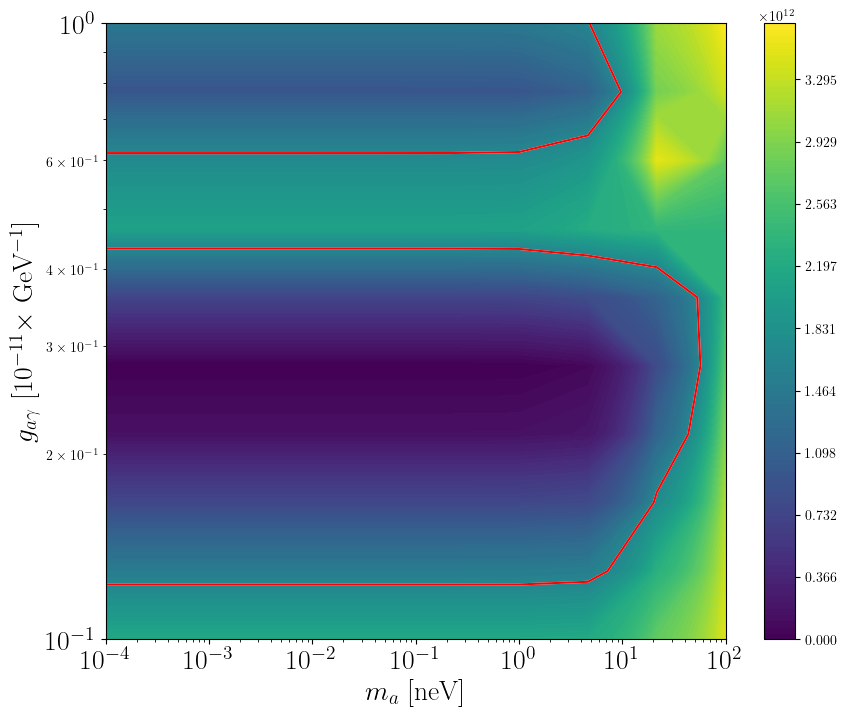

In [45]:
##### STATISTICAL ANALYSIS

import scipy.stats as stats

# Defining the parameter ranges for exploration
m_array = np.logspace(-4,2,10)
g_array = np.logspace(np.log10(0.1),np.log10(1),10)

# Eventually add magnetic fields etc.. 


# Function to calculate chi-squared
# def calculate_chi_squared(m, g, u_Cr):
def calculate_chi_squared(m, g):    
    model_prediction = calculate_flux_product_with_energy(file='NGC1068cascadepg_300Rs.csv',mass=m, g=g,nsim=1,B0=1e3,rgam=1e-3,n0=1e7,Rjet=1e3,EGeV=np.array([E_GeV_central])[0])[2]
    observed_errors = np.array(Flux_up)-np.array(Flux_central)
    observed_counts = np.array(Flux_central)
    chi_squared = np.sum(((observed_counts - model_prediction) / observed_errors) ** 2)
    return chi_squared

# Grid search over the parameter space
chi_squared_results = np.zeros((len(m_array), len(g_array)))

for i in range(len(m_array)):
    for j in range(len(g_array)):
        # Averaging over the u_Cr range
#         chi_squared_values = [calculate_chi_squared(m_array, g_array, u_Cr, mock_data_counts, errors_mock, bin_edges) for u_Cr in u_Cr_range]
        chi_squared_values = calculate_chi_squared(m_array[i], g_array[j])       
#         chi_squared_results[i, j] = np.mean(chi_squared_values)
        chi_squared_results[i, j] = chi_squared_values # Only mean for u_Cr      

# Obtaining the minimum chi-squared value
min_chi_squared = np.min(chi_squared_results)

chi_squared_results_normalized = chi_squared_results-np.min(chi_squared_results)

X, Y = np.meshgrid(m_array, g_array)
Z = chi_squared_results_normalized.T  # Transpose to align the axes correctly

# Calculating the 1 sigma and 2 sigma levels (Delta chi-squared for 2 degrees of freedom)
delta_chi_squared_1sigma = stats.chi2.ppf(0.6827, 2) - stats.chi2.ppf(0.5, 2)  # 1 sigma
delta_chi_squared_2sigma = stats.chi2.ppf(0.9545, 2) - stats.chi2.ppf(0.5, 2)  # 2 sigma

# Finding the 1 sigma and 2 sigma contours
contour_1sigma = min_chi_squared + delta_chi_squared_1sigma
contour_2sigma = min_chi_squared + delta_chi_squared_2sigma



## Plotting the chi-squared map and contours
plt.rc('font', family='serif')
plt.rc('text', usetex=True)

plt.figure(figsize=(10, 8))
cp = plt.contourf(X, Y, Z, levels=np.linspace(Z.min(), Z.max(), 100), cmap='viridis')
plt.colorbar(cp)
plt.contour(X, Y, Z, levels=[contour_1sigma, contour_2sigma], colors=['white', 'red'])
######################################################################################
plt.xlabel(r'$m_a$ [neV]', fontsize=20)
plt.ylabel(r'$g_{a\gamma}$ [$10^{-11} \times$ GeV$^{-1}$]', fontsize=20)
plt.xscale('log')
plt.yscale('log')

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.savefig('axion_contours_chi2.pdf')

plt.show()

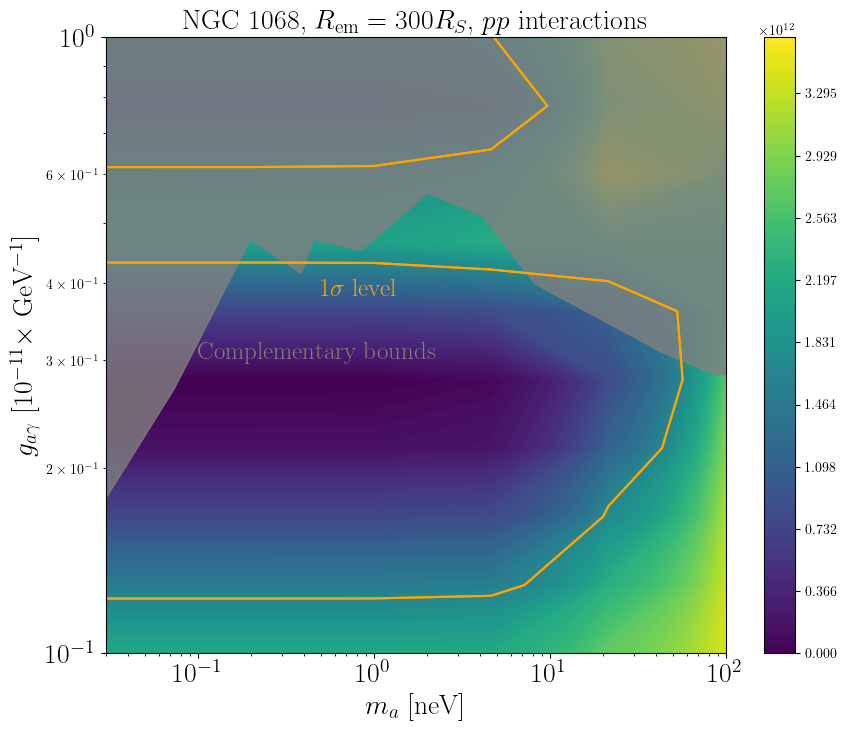

In [75]:
## Plotting the chi-squared map and contours

##########################################################################################################
ohare = pd.read_csv("axion_bounds.csv", header=None)
ohare.columns = ["logmDm", "logsigma"]
ohare_1 = list(1e9*ohare.logmDm)
ohare_2 = list(1e11*ohare.logsigma)
###########################################################################################################

plt.rc('font', family='serif')
plt.rc('text', usetex=True)

plt.figure(figsize=(10, 8))
cp = plt.contourf(X, Y, Z, levels=np.linspace(Z.min(), Z.max(), 100), cmap='viridis')
plt.colorbar(cp)
plt.contour(X, Y, Z, levels=[min_chi_squared+2.3, (min_chi_squared)+4.6], colors=['orange', 'orange'])
######################################################################################

plt.fill_between(np.array(ohare_1), np.array(ohare_2), np.linspace(100,100,len(np.array(ohare_2))),color='grey',alpha=0.8)

###################################################################################
plt.title(r"NGC 1068, $R_{\rm em}=300 R_S$, $pp$ interactions ", fontsize=20)
plt.text(0.5, 0.38,r'1$\sigma$ level', color='orange', fontsize=18)
plt.text(0.1, 0.3,r'Complementary bounds', color='grey', fontsize=18)
plt.xlabel(r'$m_a$ [neV]', fontsize=20)
plt.ylabel(r'$g_{a\gamma}$ [$10^{-11} \times$ GeV$^{-1}$]', fontsize=20)
plt.xscale('log')
plt.yscale('log')

axes = plt.gca()
axes.set_ylim([1e-1,1])
axes.set_xlim([3e-2, 1e2])

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.savefig('axion_contours_chi2.pdf')

plt.show()

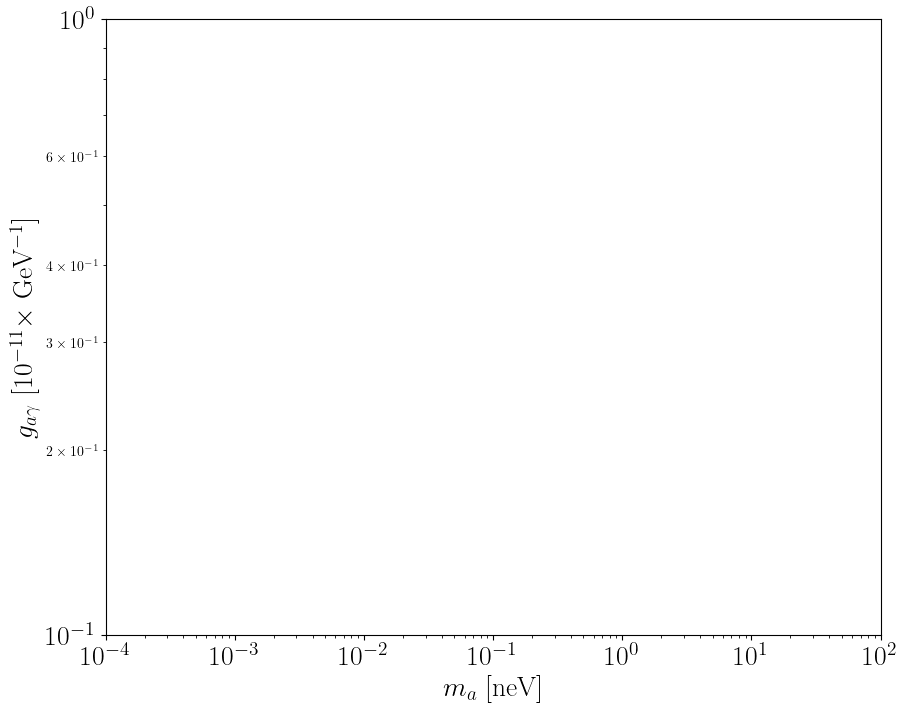

In [55]:
dof = 2

# Calculating chi-squared values for 1σ (68.3% CL) and 2σ (95.4% CL)
chi_squared_1sigma = stats.chi2.ppf(0.683, dof)
chi_squared_2sigma = stats.chi2.ppf(0.954, dof)
# Define levels such that they are in increasing order
levels = [np.min(chi_squared_results_normalized), 2.3, 2.4]
fill_colors = ['blue', 'dodgerblue']  # The color for the innermost region should be first

# Preparing for plotting
plt.rc('font', family='serif')
plt.rc('text', usetex=True)

plt.figure(figsize=(10, 8))

X, Y = np.meshgrid(m_array, g_array)
Z = chi_squared_results_normalized.T  # Transpose to align the axes correctly


# Create filled contour plot with specified levels
contourf = plt.contourf(X, Y, chi_squared_results_normalized.T, levels=levels, colors=fill_colors)

#Optionally, add contour lines to delineate the levels
contour_lines = plt.contour(X, Y, chi_squared_results_normalized.T, levels=levels, colors='dodgerblue', linewidths=2)


plt.xlabel(r'$m_a$ [neV]', fontsize=20)
plt.ylabel(r'$g_{a\gamma}$ [$10^{-11} \times$ GeV$^{-1}$]', fontsize=20)
plt.xscale('log')
plt.yscale('log')

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.savefig('axion_contour_bounds.pdf')

plt.show()

environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 1.282e+09 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inputted chi
environs.py:1196 --- INFO: Using inputted chi
environs.py: 758 --- INFO: Assuming equipartion at r0: n0(r0) = 1.282e+09 cm^-3
environs.py: 767 --- INFO: Using inputted chi
   core.py: 658 --- INFO: Running Module 0: <class 'gammaALPs.base.environs.MixJet'>
   core.py: 658 --- INFO: Running Module 1: <class 'gammaALPs.base.environs.MixICMGaussTurb'>
   core.py: 658 --- INFO: Running Module 3: <class 'gammaALPs.base.environs.MixGMF'>
environs.py: 431 --- INFO: Using inp

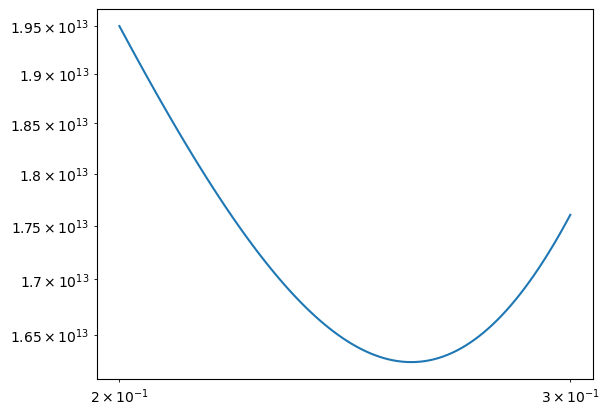

In [34]:
ga_array =np.logspace(np.log10(0.2),np.log10(0.3),100)
chi2_ma= np.array([calculate_chi_squared(1, i) for i in ga_array])
#chi2_ma_min = chi2_ma-np.min(chi2_ma) 
plt.loglog(ga_array, chi2_ma)
#plt.loglog(ga_array, np.linspace(3.8,3.8,10))
plt.show()

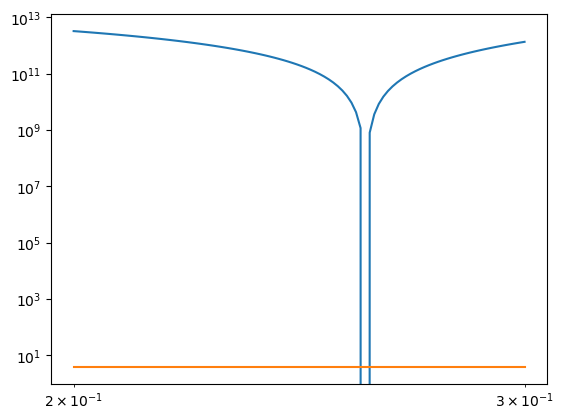

In [36]:
chi2_ma_min = chi2_ma-np.min(chi2_ma) 
plt.loglog(ga_array, chi2_ma_min)
plt.loglog(ga_array, np.linspace(3.8,3.8,100))
plt.show()

In [11]:
print(chi2_ma)
print(chi2_ma_min)

[3.10697165e+12 3.05341882e+12 3.02526613e+12 3.01977647e+12
 2.99245791e+12 3.00927639e+12 2.88054476e+12 2.83710396e+12
 2.83705859e+12 2.59785787e+12]
2597857872414.776
[5.09113779e+11 4.55560943e+11 4.27408261e+11 4.21918594e+11
 3.94600034e+11 4.11418514e+11 2.82686891e+11 2.39246089e+11
 2.39200720e+11 0.00000000e+00]
